# DCGAN TUTORIAL

**Original Author**: [Nathan Inkawhich](https://github.com/inkawhich)

**Original Tutorial**: [PyTorch DCGAN Tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)

**Translation & Tensorflow porting**: [Jimmy](https://github.com/coloriz)

## Introduction

이 튜토리얼은 예제를 통해 DCGAN을 소개합니다. 수많은 실제 연예인의 사진을 신경망에게 보여준 후, 새로운 연예인 사진을 생성하는 생성적 적대 신경망 (Generative Adversarial Network, GAN)을 학습시킬 것입니다. 여기에 있는 대부분의 코드는 [pytorch/examples](https://github.com/pytorch/examples)의 dcgan implementation에서 가져온 것이며, 원본은 PyTorch로 구현되어 있지만 여기서는 Tensorflow로 구현했습니다. 이 문서는 구현에 대한 면밀한 설명을 제공하고 이 모델이 작동하는 방법과 그 이유에 대해 설명합니다. 하지만 걱정하지 마세요. GAN에 대한 사전 지식은 필요하지 않습니다. 하지만 GAN을 처음으로 마주하는 분들은 실제 신경망 내부에서 어떤 일들이 일어나고 있는지 추론하는 데 시간을 꽤 쏟아야 할 수도 있습니다. 또한 시간 절약을 위해 GPU가 있으면 도움이 될 것입니다. (두 개면 더 좋습니다.) 그럼 시작하겠습니다.

## Generative Adversarial Networks

### GAN이 무엇인가요?

GAN은 딥러닝 모델에게 학습 데이터의 분포를 학습시키는 방법을 가르치는 프레임워크입니다. 모델이 학습 데이터의 분포를 학습하게 되면 모델은 그 분포를 따르는 새 데이터를 생성할 수 있습니다. 2014년, Ian Goodfellow가 처음으로 GAN을 고안했고 그의 논문 [Generative Adversarial Nets](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf)에 기술되어 있습니다. GAN은 *생성자 (generator)*, *구분자 (discriminator)* 라는 두 개의 서로 다른 모델로 구성되어 있습니다. 생성자의 역할은 학습 이미지처럼 보이는 '가짜' 이미지를 만들어내는 것입니다. 구분자의 역할은 이미지를 보고 이것이 진짜 학습 이미지인지, 아니면 생성자가 만들어낸 가짜 이미지인지 구분하는 것입니다. 학습 과정 중에 생성자는 더 나은 가짜들을 생성하여 구분자보다 더 똑똑해지려고 하는 반면, 구분자는 더 나은 탐정이 되어 진짜와 가짜 이미지를 정확하게 분류하기 위해 노력합니다. 생성자가 진짜 학습 데이터에서 뽑은 듯한 완벽한 가짜 이미지를 생성하고, 구분자가 항상 50%의 신뢰도로 (구분자의 출력이 0.5) 생성자의 출력이 진짜인지 추측할 때, 이 게임은 균형점에 도달합니다.

이제 튜토리얼에서 사용할 몇 가지 표기법을 정의합시다. 먼저 구분자입니다. $x$가 데이터(이미지)라고 할 때, $D(x)$는 $x$가 생성자가 아닌 학습 데이터에서 왔을 확률(스칼라)을 출력하는 구분자 네트워크입니다. 지금 우리는 이미지를 다루고 있기 때문에, $D(x)$의 입력 $x$는 64x64x3 크기의 이미지입니다. 직관적으로 봤을 때 $D(x)$는 $x$가 학습 데이터에서 왔을 때 높아야 하고, 생성자에서 왔을 때 낮아야 함을 알 수 있습니다. $D(x)$는 또한 기존의 이진 분류기(binary classifier)로 생각할 수 있습니다.

다음은 생성자의 표기법입니다. $z$는 표준 정규 분포에서 샘플링한 잠재 공간 벡터(latent space vector)입니다. 잠재 공간은 원본 데이터의 특징을 잃지 않으면서 원본 데이터보다 차원을 줄인 공간을 의미합니다. $G(z)$는 잠재 벡터에서 데이터 공간으로 매핑시키는 생성자 함수를 나타냅니다. $G$의 목표는 학습 데이터가 따르는 진짜 분포 $p_{data}$를 추정하는 것입니다. 이렇게 추정한 분포 $p_{g}$로부터 가짜 샘플을 생성할 수 있습니다.

따라서, $D(G(z))$는 생성자 $G$의 출력이 진짜 이미지일 확률(스칼라)을 나타냅니다. [Goodfellow의 논문](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf)의 표현을 빌리면, $D$와 $G$는 minimax 게임을 하고 있습니다. 이 게임에서 $D$는 진짜와 가짜를 정확하게 분류할 확률을 최대화하기 위해 노력하고 ($\log D(x)$), $G$는 $D$가 자신의 출력을 가짜라고 예측할 확률을 최소화하기 위해 노력합니다 ($\log (1 - D(G(x)))$). 논문에서 GAN 손실 함수는 다음과 같이 정의합니다.

$$\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]$$

이론적으로 이 minimax 게임의 해는 $p_{g}=p_{data}$가 될 때, 구분자가 입력이 진짜인지 가짜인지 랜덤하게 추측할 때입니다. 하지만 GAN의 수렴 이론은 여전히 활발히 연구 중이며, 실제 현실에서 모델이 항상 이 지점으로 학습되지는 않습니다.

### DCGAN이 무엇인가요?

DCGAN은 위에서 설명한 GAN의 확장판입니다. DCGAN은 구분자와 생성자에서 각각 convolutional, convolutional-transpose 레이어를 사용한다는 점만 다릅니다. Radford et. al.의 논문 [Unsupervised Representation Learning With Deep Convolutional Generative Adversarial Networks](https://arxiv.org/pdf/1511.06434.pdf)에서 처음 등장했습니다. 구분자는 strided [convolution](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D) 레이어, [batch norm](https://www.tensorflow.org/api_docs/python/tf/keras/layers/BatchNormalization) 레이어, [LeakyReLU](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LeakyReLU) 활성화 함수로 이루어져 있습니다. 입력은 64x64x3 이미지이며 출력은 입력이 진짜 데이터 분포로부터 왔을 스칼라 확률입니다. 생성자는 [convolutional-transpose](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose) 레이어, batch norm 레이어, [ReLU](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU) 활성화 함수로 이루어져 있습니다. 입력은 표준 정규 분포에서 샘플링된 잠재 벡터 $z$ 이며 출력은 64x64x3 RGB 이미지입니다. strided conv-transpose 레이어는 잠재 벡터가 이미지와 같은 크기로 변환될 수 있도록 해줍니다. 논문에서 저자들은 optimizer 설정값, 손실 함수 계산 방법, 모델 가중치 초기화 방법에 대한 팁도 공유하였습니다. 이것들은 모두 아래 섹션에서 설명할 것입니다.

In [1]:
import random
from argparse import ArgumentParser, ArgumentDefaultsHelpFormatter
from pathlib import Path

from IPython.display import HTML
%matplotlib inline
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import Input, Sequential
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.layers import BatchNormalization, Conv2D, Conv2DTranspose, Reshape
from tensorflow.keras.layers import Activation, LeakyReLU, ReLU
from tensorflow.keras.losses import BinaryCrossentropy, Reduction
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import array_to_img

import vutils

# Set random seed for reproducibility
manual_seed = 999
# manual_seed = random.randint(1, 10000)  # use if you want new results
print(f'Random Seed: {manual_seed}')
random.seed(manual_seed)
tf.random.set_seed(manual_seed)

Random Seed: 999


## Inputs

실행에 필요한 몇 가지 입력들을 정의합니다.

- **dataroot** - 데이터셋 폴더 루트의 패스입니다. 데이터셋은 다음 섹션에서 설명할 것입니다.
- **workers** - 데이터를 로딩할 때 사용할 worker 쓰레드의 수입니다.
- **batch_size** - 학습 때 사용할 배치 크기입니다. DCGAN 논문에서는 배치 크기 128을 사용했습니다.
- **image_size** - 학습 때 사용할 이미지의 크기입니다. 이 구현은 기본값으로 64x64의 이미지를 가정합니다. 만약 다른 크기를 원하면, D와 G의 구조도 바뀌어야 할 것 입니다. 자세한 내용은 [다음](https://github.com/pytorch/examples/issues/70)을 참고하세요.
- **nc** - 입력 이미지의 채널 수를 나타냅니다. 컬러 이미지의 경우 이 값은 3입니다.
- **nz** - 잠재 벡터의 길이입니다.
- **ngf** - 생성자에서 만드는 피쳐맵의 채널 수와 관련된 값입니다.
- **ndf** - 구분자에서 만드는 피쳐맵의 채널 수와 관련된 값입니다.
- **num_epochs** - 학습을 몇 epoch 실행할 것인지를 의미합니다. 더 오래 학습하면 아마도 더 좋은 결과를 기대할 수 있지만 그 만큼 더 많은 시간이 걸릴 것입니다.
- **lr** - 학습에 사용할 learning rate입니다. DCGAN 논문에 기술된 것처럼, 이 값은 0.0002가 되어야만 합니다.
- **beta1** - Adam optimizer의 beta1 하이퍼파라미터입니다. DCGAN 논문에 기술된 것처럼, 이 값은 0.5가 되어야만 합니다.
- **ngpu** - 학습에 사용할 GPU 개수입니다. 이 값이 0이라면 이 코드는 CPU 모드로 실행됩니다.

In [2]:
# Root directory for dataset
dataroot = Path('data/celeba')

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which strategy we use
if ngpu <= 0:
    strategy = tf.distribute.OneDeviceStrategy(device='/cpu:0')
elif ngpu == 1:
    strategy = tf.distribute.OneDeviceStrategy(device='/gpu:0')
else:
    strategy = tf.distribute.MirroredStrategy(devices=[f'/gpu:{i}' for i in range(ngpu)])
print(f'Device type: {"CPU" if ngpu <= 0 else "GPU"}')
print(f'Number of devices: {strategy.num_replicas_in_sync}')

Device type: GPU
Number of devices: 1


## Data

이 튜토리얼에서는 [Celeb-A Faces dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)을 사용할 것입니다. 링크된 사이트에서 다운로드 받을 수 있습니다. 데이터셋은 *img_align_celeba.zip* 이라는 파일입니다. 다운로드 받으면, *celeba* 라는 디렉토리를 생성하고 zip파일을 해당 디렉토리에 압축 해제합니다. 그리고, 이 노트북을 위한  *dataroot* 입력을 방금 생성한 *celeba* 디렉토리로 설정합니다. 결과적으로 디렉토리 구조는 다음과 같이 됩니다.

```python
/path/to/celeba
    -> img_align_celeba
        -> 188242.jpg
        -> 173822.jpg
        -> 284702.jpg
        -> 537394.jpg
           ...
```

이제 [Dataset](https://www.tensorflow.org/api_docs/python/tf/data/Dataset) 클래스를 이용해 데이터셋을 만들고, 학습 데이터 중 일부를 시각화해보겠습니다.

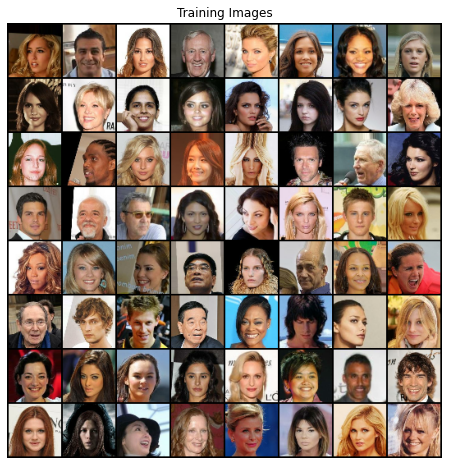

In [3]:
def parse_image(filename):
    image = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = 2 * image - 1
    shape = tf.shape(image)
    # center cropping
    h, w = shape[-3], shape[-2]
    if h > w:
        cropped_image = tf.image.crop_to_bounding_box(image, (h - w) // 2, 0, w, w)
    else:
        cropped_image = tf.image.crop_to_bounding_box(image, 0, (w - h) // 2, h, h)

    image = tf.image.resize(cropped_image, [image_size, image_size])
    return image


# Create the dataset
dataset = tf.data.Dataset.list_files(str(dataroot/'*/*'))\
    .map(parse_image, num_parallel_calls=workers)\
    .batch(batch_size)
dataset_dist = strategy.experimental_distribute_dataset(dataset)

# Plot some training images
real_batch = next(iter(dataset_dist))
fig, ax = plt.subplots(figsize=(8, 8))
ax.axis(False)
ax.set_title('Training Images')
ax.imshow(vutils.make_grid((real_batch[:64] + 1) / 2))

## Implementation

입력 파라미터들과 데이터셋이 준비되었으면 구현을 할 차례입니다. 먼저 가중치 초기화 전략부터, 생성자, 구분자, 손실 함수, 학습 루프까지 자세하게 알아볼 것입니다.

### 가중치 초기화

DCGAN 논문에서 저자들은 모든 모델의 가중치는 평균 0, 표준 편차 0.02를 따르는 정규 분포로부터 랜덤하게 초기화되어야 한다고 언급했습니다.

In [4]:
with strategy.scope():
    # Custom weights initialization called on netG and netD
    initializer = RandomNormal(0, 0.02)

### 생성자

생성자 $G$는 잠재 공간 벡터 ($z$)를 데이터 공간으로 매핑하도록 설계되었습니다. 우리의 데이터는 이미지이기 때문에 $z$를 데이터 공간으로 변환한다는 것은 궁극적으로 학습 이미지와 같은 사이즈(64x64x3)를 가진 RGB 이미지를 생성한다는 것을 의미합니다. 실제 변환 과정에서는 일련의 2차원 strided convolutional transpose 레이어를 거칩니다. 뒤이어 추가적으로 batch norm 레이어와 ReLU 활성화 함수가 붙습니다. 생성자의 출력은 입력 데이터 범위인 $[-1, 1]$로 만들기 위해 tanh 함수를 통과합니다. DCGAN 논문에 따르면 conv-transpose 레이어 뒤에 존재하는 batch norm 레이어는 성공적인 학습을 위해 필수적입니다. 이 레이어는 학습 중에 그래디언트가 앞쪽 레이어까지 잘 전달될 수 있도록 도와줍니다. 아래 그림은 DCGAN 논문에 나온 생성자의 구조를 보여줍니다.

![dcgan_generator](images/dcgan_generator.png)

입력 섹션에서 정의한 ($nz$, $ngf$, $nc$)가 코드에서 생성자 구조에 어떻게 영향을 끼치는지 주목할 필요가 있습니다. $nz$는 $z$ 입력 벡터의 길이, $ngf$는 생성자를 거쳐 전파되는 피쳐맵의 크기, $nc$는 출력 이미지의 채널 수를 결정합니다. 아래는 생성자 코드입니다.

In [5]:
with strategy.scope():
    # Generator Code
    netG = Sequential([
        Input(shape=(1, 1, nz)),
        # input is Z, going into a convolution
        Conv2DTranspose(ngf * 8, 4, 1, 'valid', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        ReLU(),
        # state size. 4 x 4 x (ngf*16)
        Conv2DTranspose(ngf * 8, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        ReLU(),
        # state size. 8 x 8 x (ngf*8)
        Conv2DTranspose(ngf * 4, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        ReLU(),
        # state size. 16 x 16 x (ngf*2)
        Conv2DTranspose(ngf * 2, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        ReLU(),
        # state size. 32 x 32 x (ngf)
        Conv2DTranspose(nc, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        Activation(tf.nn.tanh, name='tanh')
        # state size. 64 x 64 x (nc)
    ], name='generator')

출력되는 모델 구조를 통해 생성자가 어떻게 구성되었는지 확인해봅시다.

In [6]:
# Print the model
netG.summary(line_length=100)

Model: "generator"
____________________________________________________________________________________________________
Layer (type)                                 Output Shape                            Param #        
conv2d_transpose (Conv2DTranspose)           (None, 4, 4, 512)                       819200         
____________________________________________________________________________________________________
batch_normalization (BatchNormalization)     (None, 4, 4, 512)                       2048           
____________________________________________________________________________________________________
re_lu (ReLU)                                 (None, 4, 4, 512)                       0              
____________________________________________________________________________________________________
conv2d_transpose_1 (Conv2DTranspose)         (None, 8, 8, 512)                       4194304        
________________________________________________________________________

### 구분자

언급했던 대로, 구분자 $D$는 이미지를 입력받아서 입력 이미지가 진짜일 스칼라 확률을 출력하는 이진 분류기 네트워크입니다. 여기서 $D$는 64x64x3 크기의 입력 이미지를 받아서, 일련의 Conv2D, BatchNormalization, LeakyReLU 레이어를 거쳐 이미지를 처리하고, Sigmoid 활성화 함수를 통해 최종 확률을 출력합니다. *(Tensorflow에서는 손실 함수에 입력으로 logit이 아닌 probability를 주면 학습이 불안정한 문제가 있습니다. 그렇기 때문에 여기서는 구분자의 출력단에 Sigmoid 활성화 함수를 뺐습니다.)* 이 구조는 문제에 따라서 필요하다면 더 많은 레이어를 추가하여 확장할 수 있습니다. 하지만 strided convolution, BatchNorm, LeakyReLU를 쓰는 것은 중요합니다. DCGAN 논문에서 언급하기를, 다운 샘플링을 위하여 풀링 대신 strided convolution을 쓰는 것은 좋은 관행이라고 합니다. 왜냐하면 네트워크가 직접 풀링 함수를 학습하도록 하기 때문입니다. 또한, batch norm과 leaky relu 함수는 유익한 그래디언트가 전달되는 것을 촉진한다고 합니다. GAN은 학습이 어렵기로 악명 높기 때문에 $G$와 $D$의 학습 과정에서 이것은 매우 중요합니다.

In [7]:
with strategy.scope():
    # Discriminator Code
    netD = Sequential([
        Input(shape=(image_size, image_size, nc)),
        # input is 64 x 64 x (nc)
        Conv2D(ndf, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        LeakyReLU(0.2),
        # state size. 32 x 32 x (ndf)
        Conv2D(ndf * 2, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        LeakyReLU(0.2),
        # state size. 16 x 16 x (ndf*2)
        Conv2D(ndf * 4, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        LeakyReLU(0.2),
        # state size. 8 x 8 x (ndf*4)
        Conv2D(ndf * 8, 4, 2, 'same', use_bias=False, kernel_initializer=initializer),
        BatchNormalization(),
        LeakyReLU(0.2),
        # state size. 4 x 4 x (ndf*8)
        Conv2D(1, 4, 1, 'valid', use_bias=False, kernel_initializer=initializer),
        # state size. 1 x 1 x 1
        Reshape((1,))
    ], name='discriminator')

구분자의 모델 구조를 출력해봅시다.

In [8]:
# Print the model
netD.summary(line_length=100)

Model: "discriminator"
____________________________________________________________________________________________________
Layer (type)                                 Output Shape                            Param #        
conv2d (Conv2D)                              (None, 32, 32, 64)                      3072           
____________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)                      (None, 32, 32, 64)                      0              
____________________________________________________________________________________________________
conv2d_1 (Conv2D)                            (None, 16, 16, 128)                     131072         
____________________________________________________________________________________________________
batch_normalization_4 (BatchNormalization)   (None, 16, 16, 128)                     512            
____________________________________________________________________

### Loss Functions and Optimizers

$D$와 $G$ 세팅이 완료되면, 이제 손실 함수와 optimizer를 통해 모델이 어떻게 학습할지 결정할 차례입니다. 여기서는 다음과 같이 정의되는 [Binary Cross Entropy](https://www.tensorflow.org/api_docs/python/tf/keras/losses/BinaryCrossentropy) 손실 함수를 사용합니다.

$$\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]$$

이 함수가 두 개의 로그 부분 $y \cdot \log x$, $(1 - y) \cdot \log (1 - x)$으로 구성된다는 것에 주목하시기 바랍니다. 입력 $y$에 따라 BCE 수식에서 어떤 부분을 쓸지 지정하면, 위에서 봤던 GAN의 목적 함수의 항 $\log (D(x))$와 $\log (1 - D(G(z)))$를 계산할 수 있습니다. 다음 섹션의 학습 루프에서 자세히 살펴볼 것이지만, 여기서 기억해야 할 것은 단순히 $y$값을 변경하여 계산하고 싶은 요소를 선택할 수 있다는 것입니다.

다음은 데이터에 라벨을 붙이는 작업입니다. 진짜 라벨을 1로, 가짜 라벨을 0으로 정의하는데 이것은 원본 GAN 논문에서 사용된 관행이며, $D$와 $G$의 손실을 계산할 때 사용됩니다. 마지막으로 두 개의 서로 다른 optimizer를 세팅합니다. 하나는 $D$를 위한 것이고 다른 하나는 $G$를 위한 것입니다. DCGAN 논문에 기술된 바에 따르면 두 optimizer는 learning rate 0.0002와 Beta1 0.5로 세팅된 Adam optimizer입니다. 생성자의 학습 진행 상황을 눈으로 보기 위해서, `fixed_noise`라는 가우시안 분포에서 샘플링한 잠재 벡터를 생성합니다. 학습 루프에서 주기적으로 $G$에 `fixed_noise`를 입력하여 학습이 진행됨에 따라 이 노이즈로부터 만들어진 이미지가 어떻게 변화하는지 살펴볼 것입니다.

In [9]:
with strategy.scope():
    # Initialize BCELoss function
    criterion = BinaryCrossentropy(from_logits=True, reduction=Reduction.NONE)
    
    def compute_loss(y_true, y_pred):
        per_example_loss = criterion(y_true, y_pred)
        return tf.nn.compute_average_loss(per_example_loss, global_batch_size=batch_size)

    # Setup Adam optimizers for both G and D
    optimizerD = Adam(learning_rate=lr, beta_1=beta1)
    optimizerG = Adam(learning_rate=lr, beta_1=beta1)

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = tf.random.normal([64, 1, 1, nz])

### 학습

이제 GAN 프레임워크에 필요한 모든 것을 정의했으므로, 학습을 시작할 수 있습니다. 하지만 주의하세요. GAN의 학습은 어느 정도 요령이 필요합니다. 왜냐하면 잘못된 하이퍼파라미터 세팅은 무엇이 잘못 되었는지에 대한 설명이 거의 없이 mode collapse와 같은 학습 실패로 이어집니다. 여기서는 [ganhacks](https://github.com/soumith/ganhacks)에 나와있는 몇 가지 모범 사례를 준수하면서 기본적으로는 Goodfellow 논문의 알고리즘 1을 따를 것입니다. 즉, "진짜와 가짜 이미지에 대해 서로 다른 미니 배치를 구성"하고, $\log D(G(z))$를 최대화하도록 $G$의 목적 함수를 수정할 것입니다. 학습은 두 개의 주요 파트로 나뉩니다. 파트 1은 구분자를 업데이트하고 파트 2는 생성자를 업데이트합니다.

**파트 1 - 구분자 학습**

구분자 학습의 목적은 입력 받은 이미지가 진짜인지 가짜인지 올바르게 구분할 확률을 최대화하는 것입니다. Goodfellow의 표현을 빌리면, "확률적으로 얻은 그래디언트를 거슬러 올라가도록 구분자를 업데이트"하기를 원합니다. 실질적으로는 $\log (D(x)) + \log (1 - D(G(z)))$를 최대화하기를 원합니다. ganhacks에서 제시한 서로 다른 미니 배치 구성 전략에 따라, 이것을 두 단계에 거쳐서 계산할 것입니다. 첫째, 학습 데이터셋에서 진짜 샘플의 배치를 구성하고, $D$를 통해 순방향 전달(forward pass)하여 손실을 계산합니다($\log (D(x))$). 그리고 역방향 전달(backward pass)에서 그래디언트를 계산합니다. 둘째, 현재 생성자에서 가짜 샘플들로 배치를 구성하고, $D$를 통해 순방향 전달하여 손실을 계산합니다($\log (1 - D(G(z)))$). 그리고 역방향 전달에서 그래디언트를 누적시킵니다. 이제 모두 진짜로 구성된 배치와 모두 가짜로 구성된 배치에서 누적한 그래디언트를 가지고 구분자의 optimizer를 호출합니다.

**파트 2 - 생성자 학습**

원본 논문에서 언급한 대로 우리의 목적은 생성자가 더 나은 가짜들을 만들어내도록 $\log (1 - D(G(z)))$를 최소화하는 방향으로 생성자를 학습시키는 것이 목표입니다. Goodfellow에 따르면 학습 과정 초기에는 충분한 그래디언트가 공급되지 않습니다. 이것을 고치기 위해 대신 $\log (D(G(z)))$를 최대화 시키도록 손실 함수를 변경합니다. 이것은 코드에서 다음과 같이 표현됩니다. 파트 1의 구분자를 이용해 생성자의 출력을 분류하고, *진짜 라벨(즉, 1)을 GT로* $G$의 손실을 계산합니다. 역방향 전달에서 $G$의 그래디언트를 계산하고 optimizer를 호출하여 $G$의 파라미터를 갱신합니다. 손실 함수의 GT 라벨로 진짜 라벨을 사용하는 것이 직관적이지 않아 보일수 있지만, 이렇게 함으로써 BCELoss에서 $\log (1 - x)$ 부분이 아닌, 우리가 원하는 $\log (x)$ 부분을 사용할 수 있습니다.

마지막으로 몇 가지 수치를 프린트하고, 매 epoch마다 `fixed_noise` 배치를 생성자에 넣어서 시각적으로 학습의 진행 과정을 관찰합니다. 프린트하는 수치는 다음과 같습니다.

- **Loss_D** - 모두 진짜와 모두 가짜 배치 손실의 합으로 계산된 구분자의 손실입니다. ($\log (D(x)) + \log (D(G(z)))$)
- **Loss_G** - $\log (D(G(z)))$로 계산되는 생성자의 손실입니다.
- **D(x)** - 진짜 이미지 배치에 대한 구분자 출력의 평균값입니다. 이 값은 처음엔 1에 가깝다가 $G$가 발전함에 따라 이론적으로 0.5에 수렴합니다. (왜 그런지 한번 생각해보세요!)
- **D(G(z))** - 가짜 이미지 배치에 대한 구분자 출력의 평균값입니다. 첫 번째 값은 $D$를 갱신하기 이전, 두 번째 값은 $D$를 갱신한 이후의 값입니다. 이 숫자들은 0에서 시작해서 $G$가 발전함에 따라 0.5로 수렴합니다. (왜 그런지 한번 생각해보세요!)

**Note:** 이 단계는 epoch가 몇 번인지에 따라 시간이 꽤 걸릴 수 있습니다.

In [10]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

# Training step
def train_step(data):
    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    # Format batch
    batch_size = data.shape[0]
    # Generate batch of latent vectors
    noise = tf.random.normal([batch_size, 1, 1, nz])
    # Generate fake image batch with G
    fake = netG(noise, training=True)
    with tf.GradientTape(persistent=True) as tape:
        # Forward pass real batch through D
        real_output = netD(data, training=True)
        # Calculate loss on all-real batch
        errD_real = compute_loss(tf.ones_like(real_output), real_output)
        # Classify all fake batch with D
        fake_output = netD(fake, training=True)
        # Calculate D's loss on the all-fake batch
        errD_fake = compute_loss(tf.zeros_like(fake_output), fake_output)
    # Calculate gradients for D in backward pass
    gradients_real = tape.gradient(errD_real, netD.trainable_variables)
    gradients_fake = tape.gradient(errD_fake, netD.trainable_variables)
    # Add the gradients from the all-real and all-fake batches
    accumulated_gradients = [g1 + g2 for g1, g2 in zip(gradients_real, gradients_fake)]
    # Update D
    optimizerD.apply_gradients(zip(accumulated_gradients, netD.trainable_variables))
    D_x = tf.math.reduce_mean(tf.math.sigmoid(real_output))
    D_G_z1 = tf.math.reduce_mean(tf.math.sigmoid(fake_output))
    errD = errD_real + errD_fake

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    with tf.GradientTape() as tape:
        # Since we just updated D, perform another forward pass of all-fake batch through D
        fake = netG(noise, training=True)
        fake_output = netD(fake, training=True)
        # Calculate G's loss based on this output
        # fake labels are real for generator cost
        errG = compute_loss(tf.ones_like(fake_output), fake_output)
    # Calculate gradients for G
    gradients = tape.gradient(errG, netG.trainable_variables)
    # Update G
    optimizerG.apply_gradients(zip(gradients, netG.trainable_variables))
    D_G_z2 = tf.math.reduce_mean(tf.math.sigmoid(fake_output))

    return errD, errG, D_x, D_G_z1, D_G_z2


@tf.function
def distributed_train_step(dist_inputs):
    errD, errG, D_x, D_G_z1, D_G_z2 = strategy.run(train_step, args=(dist_inputs,))
    return strategy.reduce(tf.distribute.ReduceOp.SUM, errD, axis=None), \
           strategy.reduce(tf.distribute.ReduceOp.SUM, errG, axis=None), \
           strategy.reduce(tf.distribute.ReduceOp.MEAN, D_x, axis=None), \
           strategy.reduce(tf.distribute.ReduceOp.MEAN, D_G_z1, axis=None), \
           strategy.reduce(tf.distribute.ReduceOp.MEAN, D_G_z2, axis=None)


# Training Loop
print('Starting Training Loop...')
# For each epoch
for epoch in range(1, num_epochs + 1):
    # For each batch in the dataset
    for i, data in enumerate(dataset_dist):
        errD, errG, D_x, D_G_z1, D_G_z2 = distributed_train_step(data)

        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataset)}]\t'
                  f'Loss_D: {errD:.4f}\t'
                  f'Loss_G: {errG:.4f}\t'
                  f'D(x): {D_x:.4f}\t'
                  f'D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}')
        
        # Save Losses for plotting later
        G_losses.append(errG.numpy())
        D_losses.append(errD.numpy())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs) and (i == len(dataset) - 1)):
            fake = netG(fixed_noise, training=False)
            # Scale it back to [0, 1]
            fake = (fake + 1) / 2
            img_list.append(vutils.make_grid(fake))
        
        iters += 1

Starting Training Loop...
[1/5][0/1583]	Loss_D: 1.8640	Loss_G: 5.1785	D(x): 0.5188	D(G(z)): 0.5541 / 0.0101
[1/5][50/1583]	Loss_D: 0.4361	Loss_G: 7.5177	D(x): 0.8206	D(G(z)): 0.0013 / 0.0019
[1/5][100/1583]	Loss_D: 0.8667	Loss_G: 2.2948	D(x): 0.6500	D(G(z)): 0.1753 / 0.1537
[1/5][150/1583]	Loss_D: 1.1256	Loss_G: 3.8868	D(x): 0.8595	D(G(z)): 0.5442 / 0.0458
[1/5][200/1583]	Loss_D: 0.9263	Loss_G: 2.0089	D(x): 0.6471	D(G(z)): 0.2760 / 0.1844
[1/5][250/1583]	Loss_D: 0.7747	Loss_G: 2.9123	D(x): 0.6755	D(G(z)): 0.2521 / 0.0678
[1/5][300/1583]	Loss_D: 0.4615	Loss_G: 4.4232	D(x): 0.7892	D(G(z)): 0.1134 / 0.0212
[1/5][350/1583]	Loss_D: 0.7921	Loss_G: 2.0136	D(x): 0.6448	D(G(z)): 0.2174 / 0.1717
[1/5][400/1583]	Loss_D: 0.7974	Loss_G: 2.2701	D(x): 0.6570	D(G(z)): 0.1980 / 0.1389
[1/5][450/1583]	Loss_D: 0.8527	Loss_G: 3.9144	D(x): 0.7751	D(G(z)): 0.3710 / 0.0443
[1/5][500/1583]	Loss_D: 0.9773	Loss_G: 2.7067	D(x): 0.7733	D(G(z)): 0.4322 / 0.1043
[1/5][550/1583]	Loss_D: 1.0420	Loss_G: 2.6005	D(x): 0

## Results

이제 결과를 확인할 차례입니다. 세 가지의 다른 결과를 살펴볼 것입니다. 첫 번째, 학습이 진행되는 동안 $D$와 $G$의 손실이 어떻게 변하는지 살펴봅니다. 두 번째, 매 epoch마다 `fixed_noise` 배치에 대한 $G$의 출력을 시각화해봅니다. 그리고 마지막 세 번째, 진짜 데이터 배치와 $G$를 통해 얻은 가짜 이미지 배치를 나란히 놓고 비교해봅니다.

**학습 진행에 따른 손실**

아래 코드는 매 반복마다 $D$와 $G$의 손실을 그래프로 나타냅니다.

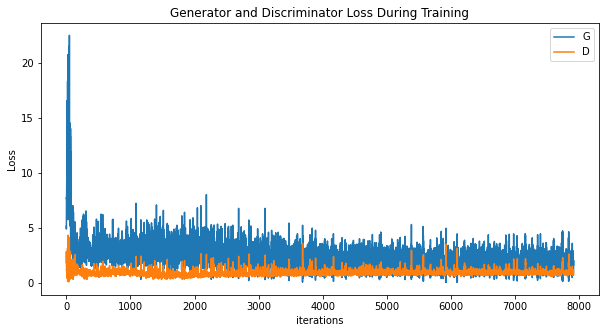

In [11]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title('Generator and Discriminator Loss During Training')
ax.plot(G_losses, label='G')
ax.plot(D_losses, label='D')
ax.set_xlabel('iterations')
ax.set_ylabel('Loss')
ax.legend()

**$G$의 진행 과정 시각화**

학습의 매 epoch마다 `fixed_noise` 배치로부터 생성자의 출력을 저장했던 것을 기억하시나요? 이제 $G$의 학습 진행 과정을 애니메이션으로 시각화할 수 있습니다. 애니메이션을 재생하려면 플레이 버튼을 누르세요.

In [12]:
%%capture
fig, ax = plt.subplots(figsize=(8, 8))
ax.axis(False)
ims = [[ax.imshow(i, animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

In [13]:
HTML(ani.to_jshtml())

**진짜 이미지 vs. 가짜 이미지**

진짜 이미지와 가짜 이미지를 나란히 비교해봅시다.

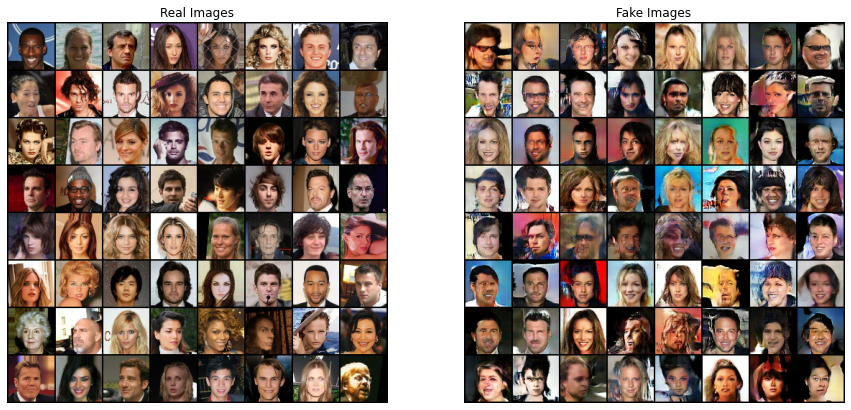

In [14]:
# Grab a batch of real images from the dataset
real_batch = next(iter(dataset_dist))

fig, ax_arr = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
# Plot the real images
ax_arr[0].axis(False)
ax_arr[0].set_title('Real Images')
ax_arr[0].imshow(vutils.make_grid((real_batch[:64] + 1) / 2))

# Plot the fake images form the last epoch
ax_arr[1].axis(False)
ax_arr[1].set_title('Fake Images')
ax_arr[1].imshow(img_list[-1])